# Electric Vehicle Accident Analysis , Israel  2018-19


Importing the libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import osmnx as ox
import networkx as nx
import matplotlib.colors as colors
import  matplotlib.cm as cm
import geopandas as gpd
import plotly.express as px

import plotly
import plotly.offline as plty
plt.rc('axes', labelsize=14)

from shapely.geometry import Point
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

### Graph Of Tel Aviv, Israel

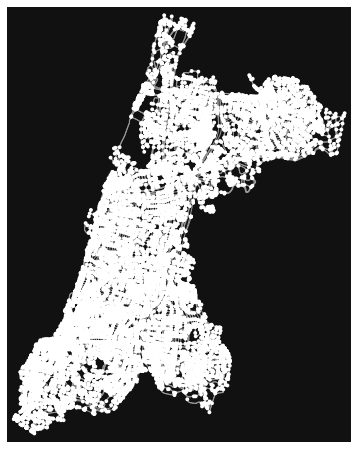

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

In [2]:
ox.plot_graph(ox.graph_from_place("Tel Aviv,Israel"))

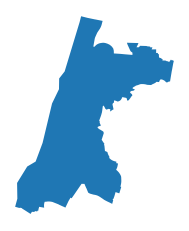

In [3]:
city = ox.geocode_to_gdf("Tel Aviv,Israel")
ax = ox.project_gdf(city).plot()
_ = ax.axis('off')

Administrative boundary vector geometries retrieved for Tel Aviv,Israel

Reading the data file (file-electricvehicleaccidentbs.csv)

In [2]:
df = pd.read_csv('/Users/divyabisht/Desktop/electricvehicleaccidentbs.csv')

In [104]:
df.head()

,accident_id,provider_and_id,provider_code,file_type_police,involved_type,involved_type_hebrew,license_acquiring_date,age_group,age_group_hebrew,sex,...,engine_volume_hebrew,manufacturing_year,vehicle_attribution_hebrew,seats,total_weight,total_weight_hebrew,vehicle_vehicle_type,vehicle_vehicle_type_hebrew,vehicle_damage,vehicle_damage_hebrew
0,2018013760,32018013760,3,3,3,נפגע,0,18,85+,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2018013760,32018013760,3,3,1,נהג,0,99,לא ידוע,NaN,...,לא ידוע,NaN,ישראלי,99.0,NaN,NaN,23.0,אופניים חשמליים,4.0,אין נזק
2,2018042928,32018042928,3,3,1,נהג,2011,7,30-34,2.0,...,501-1000,2015.0,ישראלי,2.0,1.0,עד 1.9,1.0,רכב נוסעים פרטי,4.0,אין נזק
3,2018042928,32018042928,3,3,2,נהג נפגע,0,7,30-34,1.0,...,לא ידוע,NaN,ישראלי,99.0,NaN,NaN,23.0,אופניים חשמליים,1.0,קל
4,2018078809,32018078809,3,3,2,נהג נפגע,2000,8,35-39,1.0,...,1001-1300,2006.0,ישראלי,99.0,1.0,עד 1.9,1.0,רכב נוסעים פרטי,4.0,אין נזק


In [4]:
df.shape

(7907, 118)

Number of Rows in Dataset: 7907

Number of Columns in Dataset:118

In [4]:
desc = df.describe()
desc

,accident_id,provider_and_id,provider_code,file_type_police,involved_type,license_acquiring_date,age_group,sex,involve_vehicle_type,safety_measures,...,longitude,latitude,x,y,engine_volume,manufacturing_year,seats,total_weight,vehicle_vehicle_type,vehicle_damage
count,7.907000e+03,7.907000e+03,7907.000000,7907.000000,7907.000000,7907.000000,7907.000000,7083.000000,7505.000000,7905.000000,...,7906.000000,7906.000000,7906.000000,7906.000000,7505.000000,5140.000000,7505.000000,4609.000000,7505.000000,7389.000000
mean,2.018520e+09,2.687371e+10,2.485519,2.512837,1.606804,1010.266220,26.900468,1.112099,14.551366,4.550032,...,34.879587,32.047811,188747.209461,661673.754237,2.673284,1186.192607,72.018787,1.141028,14.551366,2.931249
std,5.002365e+05,8.742830e+09,0.874281,0.858540,0.626443,999.072692,36.710342,0.567524,9.759696,1.154251,...,0.168359,0.527873,15920.219627,58521.685761,3.567408,989.967194,42.703364,2.251462,9.759696,1.422853
min,2.018000e+09,1.201800e+10,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,...,34.431352,29.524819,145798.000000,381927.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,2.018048e+09,1.201909e+10,1.000000,3.000000,1.000000,0.000000,6.000000,1.000000,1.000000,5.000000,...,34.775904,31.935063,178979.000000,649154.000000,0.000000,0.000000,5.000000,0.000000,1.000000,1.000000
50%,2.018094e+09,3.201806e+10,3.000000,3.000000,2.000000,1963.000000,9.000000,1.000000,21.000000,5.000000,...,34.822043,32.065537,183339.000000,663657.000000,0.000000,2007.000000,99.000000,1.000000,21.000000,4.000000
75%,2.019046e+09,3.201903e+10,3.000000,3.000000,2.000000,2000.000000,15.000000,1.000000,23.000000,5.000000,...,34.942158,32.140938,194175.000000,672010.750000,6.000000,2014.000000,99.000000,1.000000,23.000000,4.000000
max,2.019100e+09,3.201910e+10,3.000000,3.000000,3.000000,2019.000000,99.000000,2.000000,25.000000,5.000000,...,35.695596,33.278852,265384.000000,798194.000000,13.000000,2019.000000,99.000000,17.000000,25.000000,4.000000


In [5]:
print(df.dtypes)

accident_id                      int64
provider_and_id                  int64
provider_code                    int64
file_type_police                 int64
involved_type                    int64
                                ...   
total_weight_hebrew             object
vehicle_vehicle_type           float64
vehicle_vehicle_type_hebrew     object
vehicle_damage                 float64
vehicle_damage_hebrew           object
Length: 118, dtype: object


<AxesSubplot:>

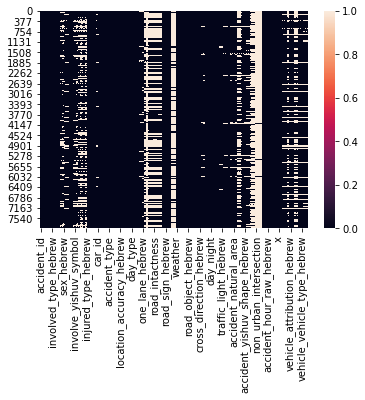

In [6]:
sns.heatmap(df.isnull())

The white space shows null values.

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

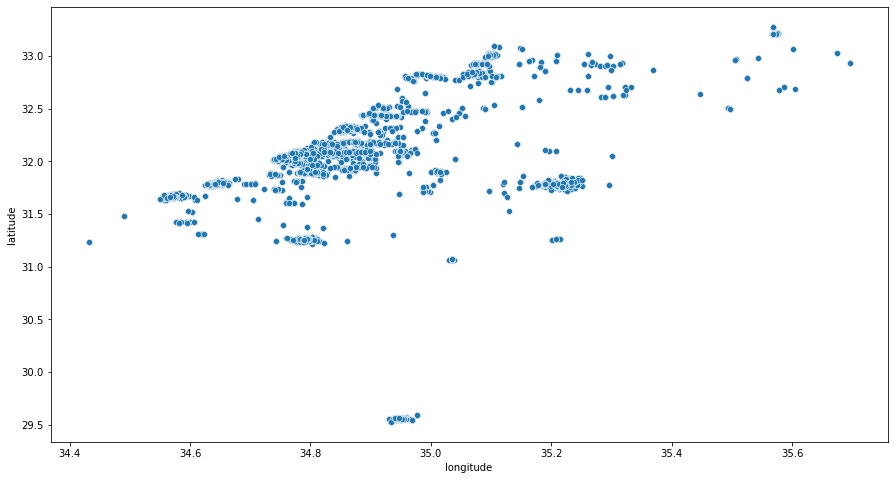

In [7]:
plt.figure(figsize = (15,8))
sns.scatterplot(df['longitude'], df['latitude'])

In [8]:
df_geo = gpd.GeoDataFrame(df,geometry = gpd.points_from_xy(df.longitude,df.latitude))

In [9]:
df_geo

,accident_id,provider_and_id,provider_code,file_type_police,involved_type,involved_type_hebrew,license_acquiring_date,age_group,age_group_hebrew,sex,...,manufacturing_year,vehicle_attribution_hebrew,seats,total_weight,total_weight_hebrew,vehicle_vehicle_type,vehicle_vehicle_type_hebrew,vehicle_damage,vehicle_damage_hebrew,geometry
0,2018013760,32018013760,3,3,3,נפגע,0,18,85+,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,POINT (34.81661 32.06033)
1,2018013760,32018013760,3,3,1,נהג,0,99,לא ידוע,NaN,...,NaN,ישראלי,99.0,NaN,NaN,23.0,אופניים חשמליים,4.0,אין נזק,POINT (34.81661 32.06033)
2,2018042928,32018042928,3,3,1,נהג,2011,7,30-34,2.0,...,2015.0,ישראלי,2.0,1.0,עד 1.9,1.0,רכב נוסעים פרטי,4.0,אין נזק,POINT (35.10098 32.75177)
3,2018042928,32018042928,3,3,2,נהג נפגע,0,7,30-34,1.0,...,NaN,ישראלי,99.0,NaN,NaN,23.0,אופניים חשמליים,1.0,קל,POINT (35.10098 32.75177)
4,2018078809,32018078809,3,3,2,נהג נפגע,2000,8,35-39,1.0,...,2006.0,ישראלי,99.0,1.0,עד 1.9,1.0,רכב נוסעים פרטי,4.0,אין נזק,POINT (35.08433 32.92836)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7902,2018005642,12018005642,1,1,2,נהג נפגע,2010,7,30-34,1.0,...,NaN,ישראלי,99.0,NaN,NaN,23.0,אופניים חשמליים,1.0,קל,POINT (34.77355 32.02871)
7903,2018056690,12018056690,1,1,1,נהג,2003,7,30-34,1.0,...,2007.0,ישראלי,3.0,2.0,2.0-2.9,2.0,משא עד 3.5 טון - אחוד (טרנזיט),1.0,קל,POINT (35.10861 32.80434)
7904,2018056690,12018056690,1,1,2,נהג נפגע,0,8,35-39,2.0,...,NaN,ישראלי,99.0,NaN,NaN,23.0,אופניים חשמליים,2.0,בינוני,POINT (35.10861 32.80434)
7905,2018084262,12018084262,1,1,1,נהג,1972,15,70-74,1.0,...,2014.0,ישראלי,3.0,1.0,עד 1.9,1.0,רכב נוסעים פרטי,1.0,קל,POINT (34.94663 31.68719)


<AxesSubplot:>

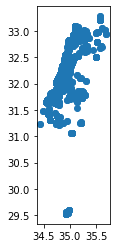

In [10]:
df_geo.plot()

In [3]:
Title = " "
def PlotPiechart(labels, values, columnName): 
    fig ={
      "data":[
          {
         "labels": labels,
          "values": values['provider_and_id'],
          #"domain": {"x": [0, 1]},
          "name": columnName,
          "hoverinfo":"label+percent+name",
          "hole": .6,
          "type": "pie"
          },
      ],
      "layout": {
           # "title":"Percentage of Accident happened in situations : " + colum
            "title":Title,
            "annotations": [
{
"font": {
"size": 40 },
                    "showarrow": False,
                    "text": " ",
                    "x": 5.50,
                    "y": 0.5
} ]
} }
    plty.iplot(fig)



## Vehicle Damaged

#### To fill not  a number values to 0.0 so they all belong to same data type for column vehicle damages

In [7]:
df.vehicle_damage = df.vehicle_damage.fillna(0.0)

<AxesSubplot:xlabel='vehicle_damage', ylabel='count'>

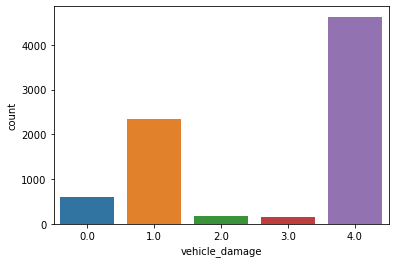

In [8]:
sns.countplot(df['vehicle_damage'])

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

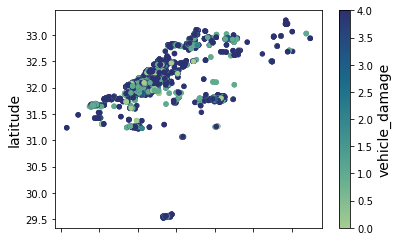

In [82]:
df.plot(x="longitude", y="latitude", kind="scatter", c="vehicle_damage",
        colormap="crest")

In [4]:
Title = "Percentage of Accident happened by Damage" 
PlotPiechart(df['vehicle_damage_hebrew'].values, df, 'Damage')

### Vehicle Damaged during accident
 0.0 - Unknown/לא ידוע
 
 1.0  - easy/קל 
 
 2.0 - medium/בינוני
 
 3.0 - Hard/קשה
 
 4.0 - No damage/אין נזק

## Age Group Injured during Accident

<AxesSubplot:xlabel='age_group', ylabel='count'>

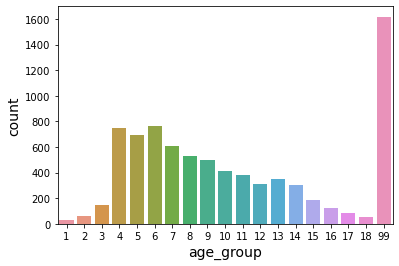

In [109]:
sns.countplot(df['age_group'])

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

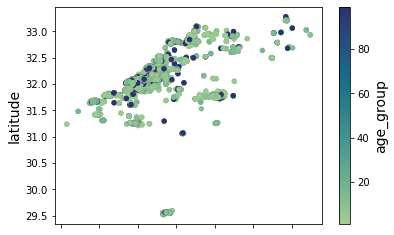

In [110]:
df.plot(x="longitude", y="latitude",kind="scatter", c="age_group",
        colormap="crest")

In [5]:
Title = "Percentage of Accident happened by Age" 
PlotPiechart(df['age_group'].values, df, 'Age')

## Gender Injured During Accident

In [116]:
df.sex = df.sex.fillna(0.0)

<AxesSubplot:xlabel='sex', ylabel='count'>

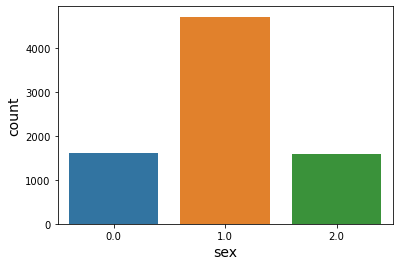

In [117]:
sns.countplot(df['sex'])

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

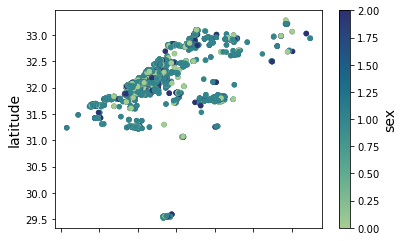

In [118]:
df.plot(x="longitude", y="latitude",kind="scatter", c="sex",
        colormap="crest")

In [6]:
Title = "Percentage of Accident happened by Gender"
PlotPiechart(df['sex'].values, df, 'Gender')

### Gender 
0.0 - Not Disclosed

1.0 - Male / זכר
 
2.0 - Female / נקבה

Male were more involved in Accidents !

## Involved Vehicle Type during Accident

<AxesSubplot:xlabel='involve_vehicle_type', ylabel='count'>

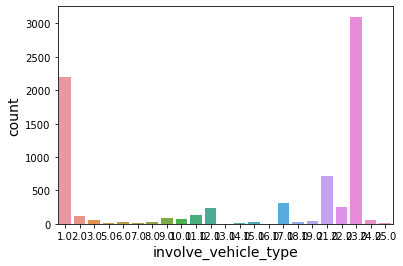

In [120]:
sns.countplot(df['involve_vehicle_type'])

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

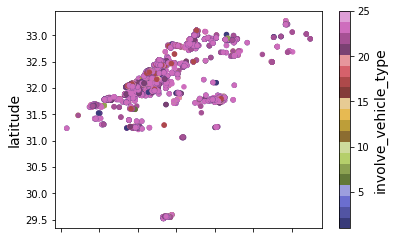

In [121]:
df.plot(x="longitude", y="latitude",kind="scatter", c="involve_vehicle_type",
        colormap="tab20b")

In [7]:
Title = "Percentage of Accident happened by Vehicle type" 
PlotPiechart(df['involve_vehicle_type'].values, df, 'Vehicle type')

### Vehicle type 

23 - Electric Bicycle / אופניים חשמליים

1  - Private passenger car / רכב נוסעים פרטי

21 and 22  - Electric scooter / קורקינט חשמלי

17 and Null -  Unknown/ אחר ולא ידוע

12 - Cab / מונית

19 - 401+ cc motorcycle / אופנוע 401+ סמ"ק

10 - 126 to 400 cc motorcycle / אופנוע 126 עד 400 סמ"ק

3 - Freight up to 3.5 tons - non-unified (pickup) / משא עד 3.5  טון - לא אחוד (טנדר)

11 - Bus / אוטובוס

9 - Motorcycle 51 to 125 cc / אופנוע 51 עד 125 סמ"ק



Maximum Number of accidents happend on electric bicycle . Whereas ridesharing platforms cabs and buses have less accidents compared to private vehicles !



### Mobility as a Service (MaaS) combines multiple different transportation modes and mobility services, such as public transport, car sharing, taxis / ride hailing and bike sharing to a single integrated platform.

Digitalized mobility services contributions to reducing vehicle kilometres and greenhouse gas emissions


#### 1. Car Sharing :

A form of car rental model is car sharing. Car sharing, unlike regular car rental, allows users to rent cars for short periods of time, generally by the hour. Cars are also available around town and can be picked up outside of business hours.

#### 1.1 Reduction of vehicle kilometers travelled (VKT) from car sharing
The reductive impacts of car sharing on VKT, when compared to the use of a private car, vary considerably between studies, ranging from 18 % to 67 % VKT reduction!

#### 1.2 Reduction of greenhouse gas and other emissions from car sharing
The GHG emissions of a typical petrol car over its lifecycle can be divided into three main sources:
production, maintenance, and disposal of the car

#### 1.3 Emission reductions from car sharing from less production, maintenance and disposal of cars

#### 1.4 Emission reductions from car-sharing from less driving and more energy- efficient cars


#### 2. Ride Sharing :

The sharing of a vehicle by passengers travelling to and/or from the same location is known as ride sharing. Trips where the driver undertakes a separate trip to take a passenger somewhere specific are not included in ride sharing (for example taxi, Uber). A web/app platform can help with ride matching (matching a driver with empty car seats and a passenger asking for a ride).

#### 2.1 Reduction of vehicle kilometers travelled from ride sharing
Ride sharing has the potential to reduce vehicle kilometers travelled, as several persons share one vehicle.

#### 2.2 GHG reductions from ride sharing



## Injury Severity during Accidents

In [9]:
df.injury_severity = df.injury_severity.fillna(0.0)

<AxesSubplot:xlabel='injury_severity', ylabel='count'>

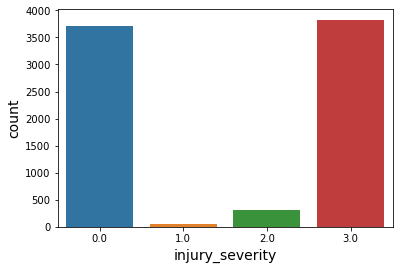

In [130]:
sns.countplot(df['injury_severity'])

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

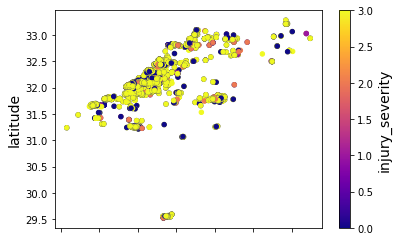

In [133]:
df.plot(x="longitude", y="latitude",kind="scatter", c="injury_severity",
        colormap="plasma")

In [10]:
Title = "Percentage of Accident happened by Injury Severity"
PlotPiechart(df['injury_severity'].values, df, 'Injury Severity')

### Injury Severity
0.0 - Status Unknown

1.0 - dead / הרוג

2.0 - Severly injured / פצוע קשה

3.0 - Slightly injured / פצוע קל



## Accident happened by Population type

<AxesSubplot:xlabel='population_type', ylabel='count'>

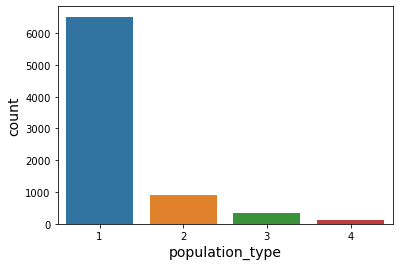

In [135]:
sns.countplot(df['population_type'])

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

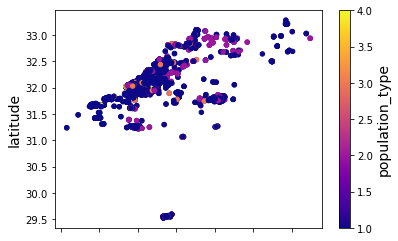

In [136]:
df.plot(x="longitude", y="latitude",kind="scatter", c="population_type",
        colormap="plasma")

In [11]:
Title = "Percentage of Accident happened by Population type" 
PlotPiechart(df['population_type'].values, df, 'Population type')

### Population Type
1 - Jews / יהודים

2 - Arabs / ערבים

3 & 4 - Others & Strangers/ זרים אחרים





## Involved Type During Accident

<AxesSubplot:xlabel='involved_type', ylabel='count'>

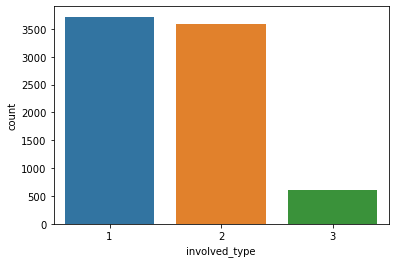

In [12]:
sns.countplot(df['involved_type'])

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

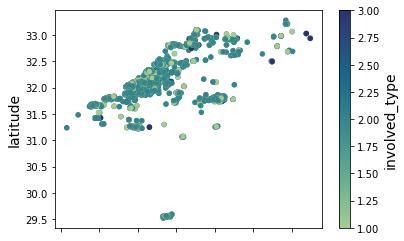

In [89]:
df.plot(x="longitude", y="latitude",kind="scatter", c="involved_type",
        colormap="crest")

In [12]:
Title = "Percentage of Accident happened by Involved type" 
PlotPiechart(df['involved_type'].values, df, 'Involved type')

### Involved type during accident
1 - Driver/נהג

2 - A driver was injured/נהג נפגע

3 - injured/נפגע

Maximum times the driver was injured !



## Injured Position During Accident 

<AxesSubplot:xlabel='injured_position', ylabel='count'>

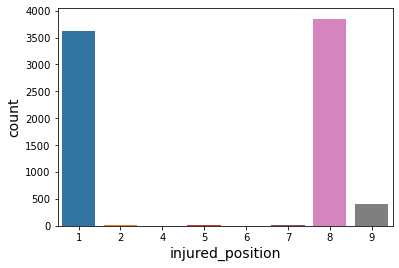

In [7]:
sns.countplot(df['injured_position'])

In [13]:
Title = "Injured position during Accident" 
PlotPiechart(df['injured_position'].values, df, 'Injured Position')

8 - Unknown / לא ידוע

1 - Sitting in the car in the front seat /ישב ברכב במושב קדמי

9 - Pedestrian / הולך רגל

2 - Sat in the car in the back seat/ ישב ברכב במושב אחורי

People in car's front are more vulnerable to accidents followed by pedestrians ! We can see here large number of position involved in accidents is unkown. 



## Accident happened by Day in week

<AxesSubplot:xlabel='day_in_week', ylabel='count'>

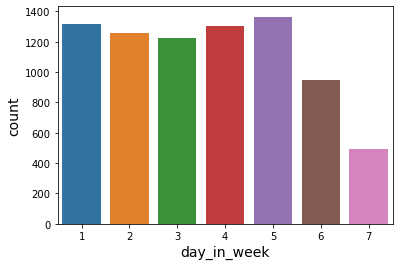

In [139]:
sns.countplot(df['day_in_week'])

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

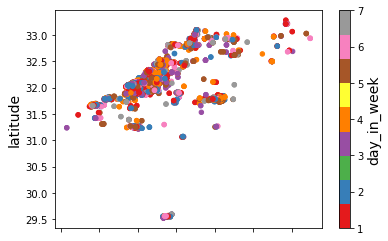

In [141]:
df.plot(x="longitude", y="latitude",kind="scatter", c="day_in_week",
        colormap="Set1")

In [14]:
Title = "Percentage of Accident happened by Day in week" 
PlotPiechart(df['day_in_week'].values, df, 'Day in week')

 During Weekend there is a drop in Accidents. 
 
 Most accidents happens during Fridays.There is less variance between accidents on Weekdays!

## Accident happened by District

<AxesSubplot:xlabel='accident_district', ylabel='count'>

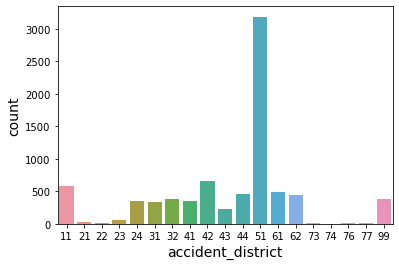

In [144]:
sns.countplot(df['accident_district'])

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

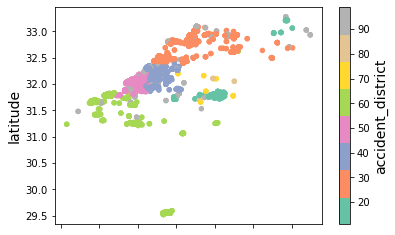

In [146]:
df.plot(x="longitude", y="latitude",kind="scatter", c="accident_district",
        colormap="Set2")

In [15]:
Title = "Percentage of Accident happened by District"
PlotPiechart(df['accident_district_hebrew'].values, df, 'District')

### District 

51 - Tel Aviv / תל אביב

31 - Haifa /חיפה

24 - Acre / עכו

11 - Jerusalem/ ירושלים

42 - Petah Tiqwa / פתח תקווה

43 - Ramla / רמלה

62 - Beer Sheva / באר שבע

41 - Hasharon/ השרון

61 - Ashkelon / אשקלון

32 - Hadera / חדרה

44 - streets / רחובות

### Maximum Accidents occur in Cities

## Accident happened by Road type

<AxesSubplot:xlabel='road_type', ylabel='count'>

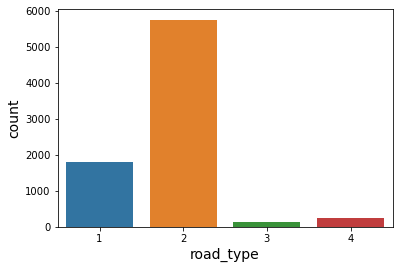

In [150]:
sns.countplot(df['road_type'])

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

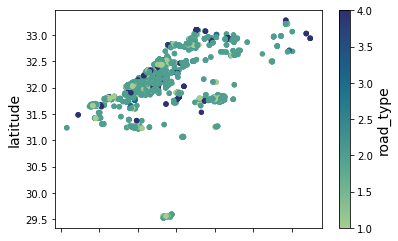

In [151]:
df.plot(x="longitude", y="latitude",kind="scatter", c="road_type",
        colormap="crest")

In [16]:
Title = "Percentage of Accident happened by Road type" 
PlotPiechart(df['road_type_hebrew'].values, df, 'Road type')

### Road Type :
 1 - Urban at the junction / עירונית בצומת
 
 2 - Urban not at the intersection / עירונית לא בצומת
 
 3 - Non-urban at the intersection/ לא-עירונית בצומת
 
 4 - Non-urban not at the junction / לא-עירונית לא בצומת
 
 
For Junctions : Signs Alerting drivers of the upcoming junctions, traffic lights, or stop signs would help in some of these areas where they are feasible.
 
 

## Multi - Lane 

<AxesSubplot:xlabel='multi_lane', ylabel='count'>

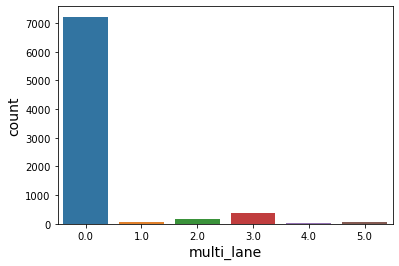

In [48]:
df.multi_lane = df.multi_lane.fillna(0)
sns.countplot(df['multi_lane'])

3 - Built-in separator without safety fence/ מיפרדה בנויה ללא גדר בטיחות

2 -Separator with safety fence / מיפרדה עם גדר בטיחות

0 - Large number of data is Unknown





## Speed Limit 


<AxesSubplot:xlabel='speed_limit', ylabel='count'>

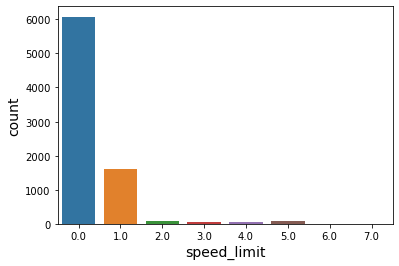

In [12]:
df.speed_limit = df.speed_limit.fillna(0)
sns.countplot(df['speed_limit'])

1 - Upto 50 km hr

2 - 60 km hr

### Large Number of data is unkown 


### We can adopt to Intelligent Transportation Systems (ITS)

ITS is a combination of leading-edge information and communication technologies due 
to the benefits that wireless devices, combined with sensing technologies and ICT smart services.

These technologies optimize ground and maritime transportation by using satellites to share information and master designing a communication environment among infrastructure, vehicles, and passenger's portable gadgets.

It used in traffic management systems to improve the safety,
efficiency, and sustainability of transportation networks, 
to reduce traffic congestion and to enhance drivers’ experiences.



